In [1]:
%pip install numpy scipy librosa matplotlib soundfile

Note: you may need to restart the kernel to use updated packages.


In [9]:
file = "recordings/recording_20260120_172104.wav"

# Simple spectrum

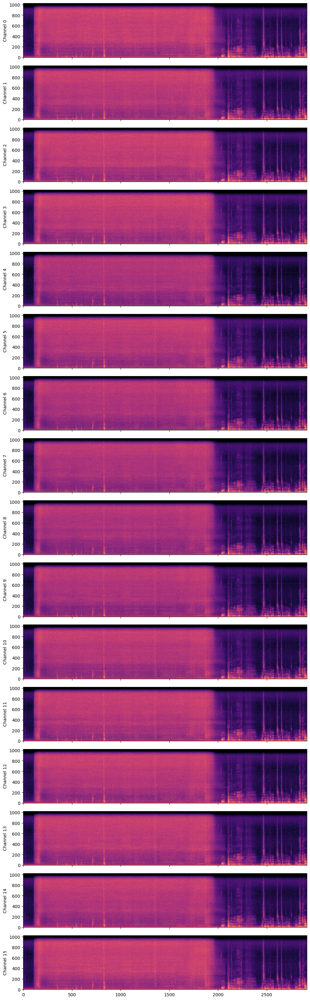

In [4]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Load audio (keeps channels separate)
y, sr = librosa.load(file, sr=None, mono=False)

# Ensure shape: (channels, samples)
if y.ndim == 1:
    y = y[np.newaxis, :]

num_channels = y.shape[0]

dpi = 100
height_px_per_channel = 200

fig, axes = plt.subplots(
    num_channels, 1,
    figsize=(10, (height_px_per_channel * num_channels) / dpi),
    dpi=dpi,
    sharex=True
)

if num_channels == 1:
    axes = [axes]

mappables = []

for ch in range(num_channels):
    S = librosa.stft(y[ch])
    S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)

    # img = librosa.display.specshow(
    #     S_db,
    #     sr=sr,
    #     x_axis="time",
    #     y_axis="hz",
    #     ax=axes[ch]
    # )
    img = axes[ch].imshow(
        S_db,
        origin="lower",
        aspect="auto",
        cmap="magma"
    )
    
    axes[ch].set_ylabel(f"Channel {ch}")
    mappables.append(img)

plt.tight_layout()
plt.show()


# Substract average of all channels from each channel

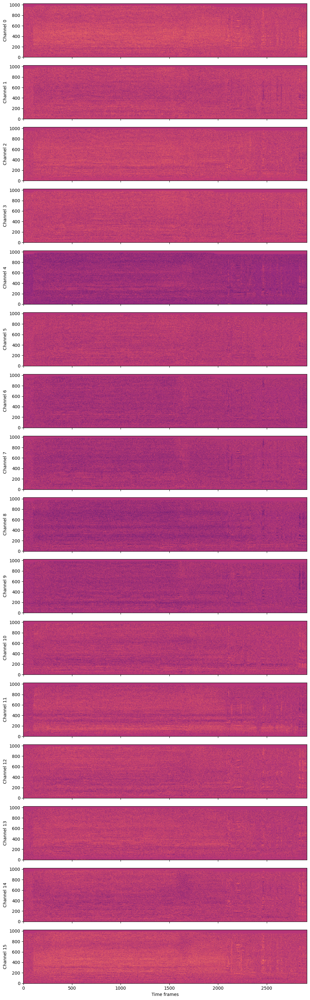

In [6]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Load audio (keeps channels separate)
y, sr = librosa.load(file, sr=None, mono=False)

# Ensure shape: (channels, samples)
if y.ndim == 1:
    y = y[np.newaxis, :]

num_channels = y.shape[0]

dpi = 100
height_px_per_channel = 200

fig, axes = plt.subplots(
    num_channels, 1,
    figsize=(10, (height_px_per_channel * num_channels) / dpi),
    dpi=dpi,
    sharex=True
)

if num_channels == 1:
    axes = [axes]

# ---- Compute spectrograms for all channels ----
S_db_channels = []

for ch in range(num_channels):
    S = librosa.stft(y[ch])
    S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)
    S_db_channels.append(S_db)

S_db_channels = np.stack(S_db_channels, axis=0)  # (channels, freq, time)

# ---- Average across channels ----
S_db_avg = np.mean(S_db_channels, axis=0)

# ---- Subtract average and render ----
for ch in range(num_channels):
    S_db_diff = S_db_channels[ch] - S_db_avg
    
    vmin, vmax = -20, 20

    axes[ch].imshow(
        S_db_diff,
        vmin=vmin, vmax=vmax, # normalization
        origin="lower",
        aspect="auto",
        cmap="magma"
    )
    axes[ch].set_ylabel(f"Channel {ch}")

axes[-1].set_xlabel("Time frames")

plt.tight_layout()
plt.show()


# Most difference

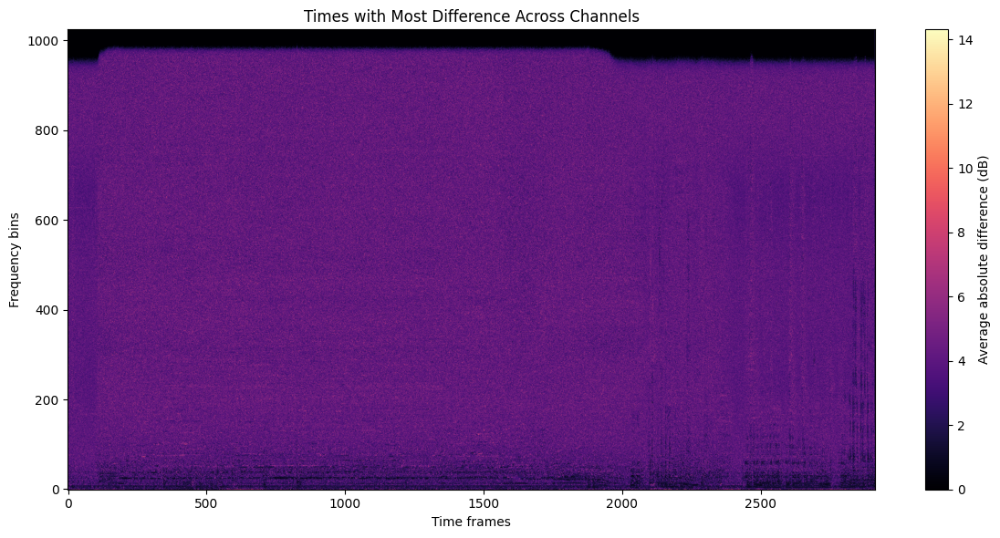

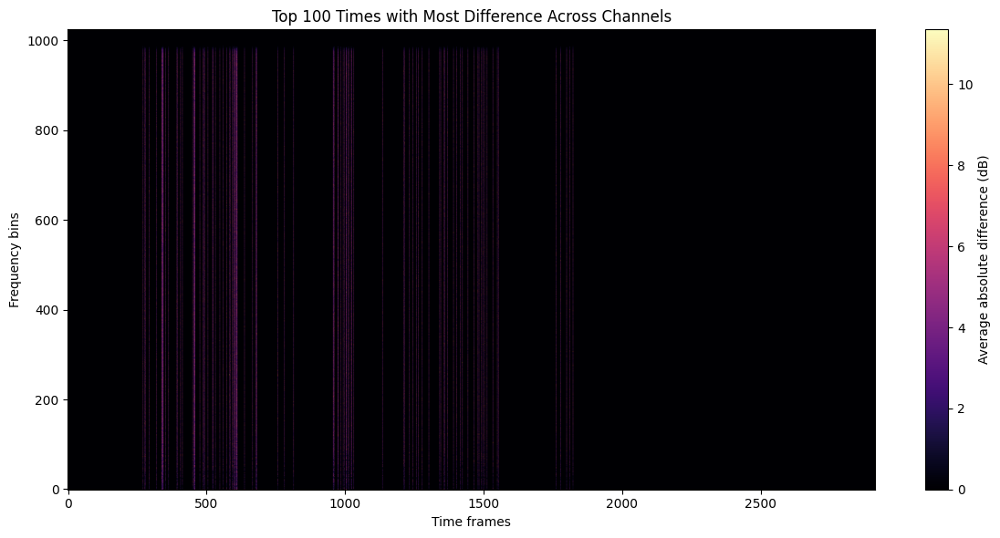

In [25]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Load audio (keeps channels separate)
y, sr = librosa.load(file, sr=None, mono=False)

# Ensure shape: (channels, samples)
if y.ndim == 1:
    y = y[np.newaxis, :]

num_channels = y.shape[0]

# ---- Compute spectrograms for all channels ----
S_db_channels = []

for ch in range(num_channels):
    S = librosa.stft(y[ch])
    S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)
    S_db_channels.append(S_db)

S_db_channels = np.stack(S_db_channels, axis=0)  # (channels, freq, time)

# ---- Average across channels ----
S_db_avg = np.mean(S_db_channels, axis=0)

# ---- Compute absolute difference from average ----
S_db_diff_abs = np.abs(S_db_channels - S_db_avg)  # (channels, freq, time)

# ---- Aggregate differences across channels ----
diff_score = np.mean(S_db_diff_abs, axis=0)  # (freq, time)

# ---- Find times with most difference ----
# Option 1: show full diff matrix
plt.figure(figsize=(12, 6))
plt.imshow(
    diff_score,
    origin="lower",
    aspect="auto",
    cmap="magma"
)
plt.colorbar(label="Average absolute difference (dB)")
plt.xlabel("Time frames")
plt.ylabel("Frequency bins")
plt.title("Times with Most Difference Across Channels")
plt.tight_layout()
plt.show()

# ---- Optional: Highlight only top N time frames ----
top_n = 100
time_indices = np.argsort(np.mean(diff_score, axis=0))[-top_n:]
highlighted_diff = np.zeros_like(diff_score)
highlighted_diff[:, time_indices] = diff_score[:, time_indices]

plt.figure(figsize=(12, 6))
plt.imshow(
    highlighted_diff,
    origin="lower",
    aspect="auto",
    cmap="magma"
)
plt.colorbar(label="Average absolute difference (dB)")
plt.xlabel("Time frames")
plt.ylabel("Frequency bins")
plt.title(f"Top {top_n} Times with Most Difference Across Channels")
plt.tight_layout()
plt.show()
